This notebook is used for using [cell2location](https://doi.org/10.1038/s41587-021-01139-4) tool to integrate scRNAseq data with ST data. It follows the tutorial given for the tool on [this page](https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_tutorial.html), as well as some additional QC steps.

This script uses 48 subtype cell with 30% threshold idea for spot annotation.

# Initialisation of packages and paths

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import squidpy as sq
from scipy.sparse import csr_matrix
import anndata as ad
import os

import cell2location
from cell2location.utils.filtering import filter_genes
from cell2location.models import RegressionModel
from cell2location import run_colocation
from cell2location.utils import select_slide

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text for PDFs

/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
results_folder = '/disk2/user/hilpek/project_root/cell2location/outputs/cell2loc2_0'

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

# Reading ST Visium data

In [3]:
adata_vis = sq.read.visium("/disk3/cda/SpatialTranscriptomics/processed-data/SpaceRanger-output_v1.0.0-rerun2023/V10F03-034_C/outs",
        counts_file='filtered_feature_bc_matrix.h5', 
        source_image_path="/disk3/cda/SpatialTranscriptomics/raw-data/High-resolution_tissue_images/V10F03-034/210223_BC_S7_V10F03-034_RJ.C1-Spot000001.jpg"
    )

/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata_vis

AnnData object with n_obs × n_vars = 2061 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [5]:
adata_vis.obs

,in_tissue,array_row,array_col
AAACACCAATAACTGC-1,1,59,19
AAACAGCTTTCAGAAG-1,1,43,9
AAACAGGGTCTATATT-1,1,47,13
AAACAGTGTTCCTGGG-1,1,73,43
AAACATGGTGAGAGGA-1,1,62,0
...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77
TTGTTTCACATCCAGG-1,1,58,42
TTGTTTCATTAGTCTA-1,1,60,30
TTGTTTCCATACAACT-1,1,45,27


In [6]:
adata_vis.uns

OrderedDict([('spatial',
              {'V10F03-034_C': {'metadata': {'chemistry_description': "Spatial 3' v1",
                 'software_version': 'spaceranger-1.0.0',
                 'source_image_path': '/disk3/cda/SpatialTranscriptomics/raw-data/High-resolution_tissue_images/V10F03-034/210223_BC_S7_V10F03-034_RJ.C1-Spot000001.jpg'},
                'images': {'hires': array([[[255, 255, 255],
                         [255, 255, 255],
                         [255, 255, 255],
                         ...,
                         [255, 255, 255],
                         [255, 255, 255],
                         [255, 255, 255]],
                 
                        [[255, 255, 255],
                         [255, 255, 255],
                         [255, 255, 255],
                         ...,
                         [255, 255, 255],
                         [255, 255, 255],
                         [255, 255, 255]],
                 
                        [[255, 255, 25

In [7]:
adata_vis.var

,gene_ids,feature_types,genome
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38
FAM138A,ENSG00000237613,Gene Expression,GRCh38
OR4F5,ENSG00000186092,Gene Expression,GRCh38
AL627309.1,ENSG00000238009,Gene Expression,GRCh38
AL627309.3,ENSG00000239945,Gene Expression,GRCh38
...,...,...,...
AC141272.1,ENSG00000277836,Gene Expression,GRCh38
AC023491.2,ENSG00000278633,Gene Expression,GRCh38
AC007325.1,ENSG00000276017,Gene Expression,GRCh38
AC007325.4,ENSG00000278817,Gene Expression,GRCh38


In [8]:
adata_vis.obsm

AxisArrays with keys: spatial

## Prepare adata_vis.obs

In [9]:
# get the sample id for each spot
adata_vis.obs['sample'] = list(adata_vis.uns['spatial'].keys())[0]

In [10]:
# add pathologist annotations
annoDf = pd.read_csv("/disk3/cda/SpatialTranscriptomics/pathologist_annotations/Tissue-annotations_pathologist-2-and-3_CSVs/V10F03-034_C_S7_Wenwen-annotations.csv")

# replace empty annotations with "Mixed"
annoDf.fillna('Mixed', inplace=True)
annoArray = annoDf["Wenwen annotations"].to_numpy()
adata_vis.obs["Pathologist_annotations"] = pd.Categorical(annoArray)

In [11]:
# add sample name to obs names, important for looking at individual slides later
adata_vis.obs["sample"] = [str(i) for i in adata_vis.obs['sample']]
adata_vis.obs_names = adata_vis.obs["sample"] + '_' + adata_vis.obs_names
adata_vis.obs.index.name = 'spot_id'

adata_vis.obs

,in_tissue,array_row,array_col,sample,Pathologist_annotations
spot_id,,,,,
V10F03-034_C_AAACACCAATAACTGC-1,1,59,19,V10F03-034_C,Tumor
V10F03-034_C_AAACAGCTTTCAGAAG-1,1,43,9,V10F03-034_C,Tumor
V10F03-034_C_AAACAGGGTCTATATT-1,1,47,13,V10F03-034_C,Mixed
V10F03-034_C_AAACAGTGTTCCTGGG-1,1,73,43,V10F03-034_C,Tumor
V10F03-034_C_AAACATGGTGAGAGGA-1,1,62,0,V10F03-034_C,Tumor
...,...,...,...,...,...
V10F03-034_C_TTGTTGTGTGTCAAGA-1,1,31,77,V10F03-034_C,Tumor
V10F03-034_C_TTGTTTCACATCCAGG-1,1,58,42,V10F03-034_C,Tumor
V10F03-034_C_TTGTTTCATTAGTCTA-1,1,60,30,V10F03-034_C,Mixed


In [12]:
adata_vis.obs["Pathologist_annotations"].value_counts()

Pathologist_annotations
Tumor            1209
Mixed             565
Stroma            213
Immune cells       57
Benign breast      17
Name: count, dtype: int64

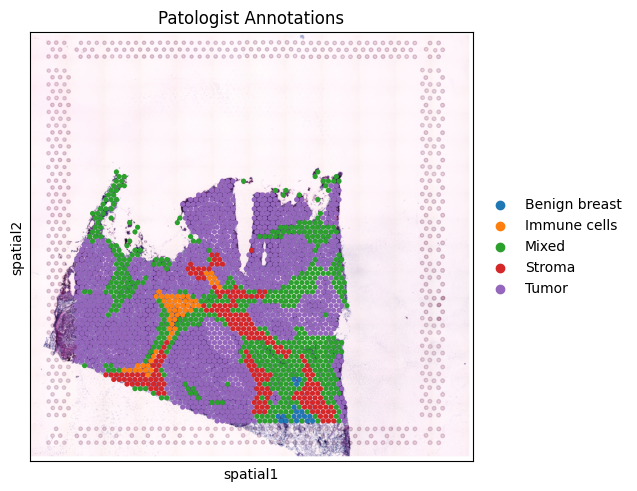

In [13]:
sq.pl.spatial_scatter(
    adata_vis,
    color="Pathologist_annotations",
    title="Patologist Annotations",
    size=1.5
)


## Prepare adata_vis.var

In [14]:
# rename genes to Ensembl IDs
adata_vis.var['SYMBOL'] = adata_vis.var_names
adata_vis.var.set_index('gene_ids', drop=True, inplace=True)
adata_vis.var

,feature_types,genome,SYMBOL
gene_ids,,,
ENSG00000243485,Gene Expression,GRCh38,MIR1302-2HG
ENSG00000237613,Gene Expression,GRCh38,FAM138A
ENSG00000186092,Gene Expression,GRCh38,OR4F5
ENSG00000238009,Gene Expression,GRCh38,AL627309.1
ENSG00000239945,Gene Expression,GRCh38,AL627309.3
...,...,...,...
ENSG00000277836,Gene Expression,GRCh38,AC141272.1
ENSG00000278633,Gene Expression,GRCh38,AC023491.2
ENSG00000276017,Gene Expression,GRCh38,AC007325.1


In [15]:
# calculate QC metrics
if not isinstance(adata_vis.X, np.ndarray):
    adata_vis.X = adata_vis.X.toarray()
    
adata_vis.var['mt'] = adata_vis.var["SYMBOL"].str.startswith(("mt-", "MT-"))
adata_vis.var["ribo"] = adata_vis.var["SYMBOL"].str.startswith(("RPS", "RPL"))

sc.pp.calculate_qc_metrics(adata_vis, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)

adata_vis.X = csr_matrix(adata_vis.X)
adata_vis.X

<2061x36601 sparse matrix of type '<class 'numpy.float32'>'
	with 1532651 stored elements in Compressed Sparse Row format>

In [16]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,Pathologist_annotations,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
spot_id,,,,,,,,,,,
V10F03-034_C_AAACACCAATAACTGC-1,1,59,19,V10F03-034_C,Tumor,447,562.0,11.0,1.957295,56.0,9.964413
V10F03-034_C_AAACAGCTTTCAGAAG-1,1,43,9,V10F03-034_C,Tumor,711,980.0,22.0,2.244898,140.0,14.285715
V10F03-034_C_AAACAGGGTCTATATT-1,1,47,13,V10F03-034_C,Mixed,754,939.0,18.0,1.916933,92.0,9.797657
V10F03-034_C_AAACAGTGTTCCTGGG-1,1,73,43,V10F03-034_C,Tumor,306,352.0,17.0,4.829545,34.0,9.659091
V10F03-034_C_AAACATGGTGAGAGGA-1,1,62,0,V10F03-034_C,Tumor,1229,1770.0,19.0,1.073446,170.0,9.604520
...,...,...,...,...,...,...,...,...,...,...,...
V10F03-034_C_TTGTTGTGTGTCAAGA-1,1,31,77,V10F03-034_C,Tumor,338,383.0,12.0,3.133159,31.0,8.093995
V10F03-034_C_TTGTTTCACATCCAGG-1,1,58,42,V10F03-034_C,Tumor,351,417.0,24.0,5.755396,61.0,14.628297
V10F03-034_C_TTGTTTCATTAGTCTA-1,1,60,30,V10F03-034_C,Mixed,1208,2311.0,34.0,1.471225,221.0,9.562960


In [17]:
# check the presence of mitochondrial genes
adata_vis.var[adata_vis.var["mt"]==True]

,feature_types,genome,SYMBOL,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
gene_ids,,,,,,,,,
ENSG00000198888,Gene Expression,GRCh38,MT-ND1,True,False,1643,2.918971,20.281417,6016.0
ENSG00000198763,Gene Expression,GRCh38,MT-ND2,True,False,1083,1.051431,47.452693,2167.0
ENSG00000198804,Gene Expression,GRCh38,MT-CO1,True,False,1859,5.473071,9.801067,11280.0
ENSG00000198712,Gene Expression,GRCh38,MT-CO2,True,False,1804,4.626395,12.469675,9535.0
ENSG00000228253,Gene Expression,GRCh38,MT-ATP8,True,False,75,0.037361,96.360990,77.0
ENSG00000198899,Gene Expression,GRCh38,MT-ATP6,True,False,1618,2.763707,21.494420,5696.0
ENSG00000198938,Gene Expression,GRCh38,MT-CO3,True,False,1955,7.518680,5.143134,15496.0
ENSG00000198840,Gene Expression,GRCh38,MT-ND3,True,False,1515,2.495391,26.491994,5143.0
ENSG00000212907,Gene Expression,GRCh38,MT-ND4L,True,False,136,0.076177,93.401262,157.0


In [18]:
# check the presence of ribosomal genes
adata_vis.var[adata_vis.var["ribo"]==True]

,feature_types,genome,SYMBOL,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
gene_ids,,,,,,,,,
ENSG00000116251,Gene Expression,GRCh38,RPL22,False,True,1253,1.379913,39.204270,2844.0
ENSG00000142676,Gene Expression,GRCh38,RPL11,False,True,1554,2.149927,24.599709,4431.0
ENSG00000117676,Gene Expression,GRCh38,RPS6KA1,False,True,103,0.051431,95.002426,106.0
ENSG00000142937,Gene Expression,GRCh38,RPS8,False,True,1608,2.542455,21.979622,5240.0
ENSG00000122406,Gene Expression,GRCh38,RPL5,False,True,1313,1.384765,36.293062,2854.0
...,...,...,...,...,...,...,...,...,...
ENSG00000241343,Gene Expression,GRCh38,RPL36A,False,True,1294,1.542940,37.214944,3180.0
ENSG00000198918,Gene Expression,GRCh38,RPL39,False,True,1376,1.702572,33.236293,3509.0
ENSG00000147403,Gene Expression,GRCh38,RPL10,False,True,1519,2.293062,26.297914,4726.0


## Filter mitochondrial and ribosomal genes

In [19]:
# find and remove MT genes for spatial mapping (keeping their counts in the object)
adata_vis.obs['mt_frac'] = adata_vis[:, adata_vis.var['mt'].tolist()].X.sum(1).A.squeeze()/adata_vis.obs['total_counts']
adata_vis.obsm['MT'] = adata_vis[:, adata_vis.var['mt'].values].X.toarray()

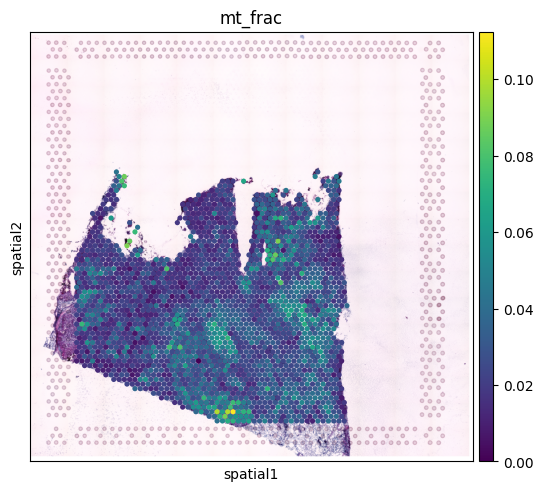

In [20]:
sq.pl.spatial_scatter(adata_vis, color='mt_frac', cmap='viridis', size=1.5)

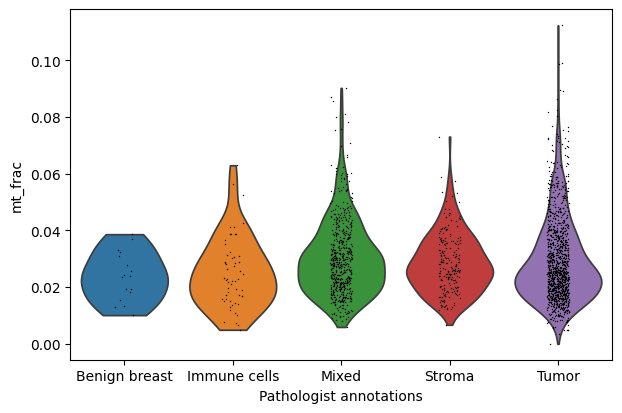

In [21]:
sc.pl.violin(adata_vis, keys='mt_frac', groupby='Pathologist_annotations')

In [22]:
adata_vis = adata_vis[:, ~adata_vis.var['mt'].values]
adata_vis

View of AnnData object with n_obs × n_vars = 2061 × 36588
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT'

In [23]:
# find and remove RB genes for spatial mapping (keeping their counts in the objm)
adata_vis.obs['ribo_frac'] = adata_vis[:, adata_vis.var['ribo'].tolist()].X.sum(1).A.squeeze()/adata_vis.obs['total_counts']
adata_vis.obsm['RB'] = adata_vis[:, adata_vis.var['ribo'].values].X.toarray()

/tmp/ipykernel_308869/2966163283.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_vis.obs['ribo_frac'] = adata_vis[:, adata_vis.var['ribo'].tolist()].X.sum(1).A.squeeze()/adata_vis.obs['total_counts']


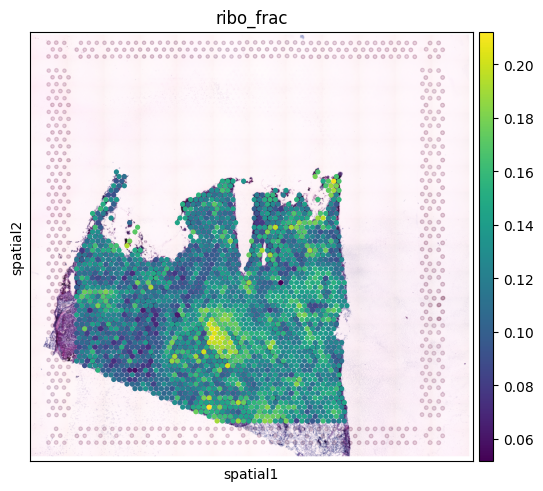

In [24]:
sq.pl.spatial_scatter(adata_vis, color='ribo_frac', cmap='viridis', size=1.5)

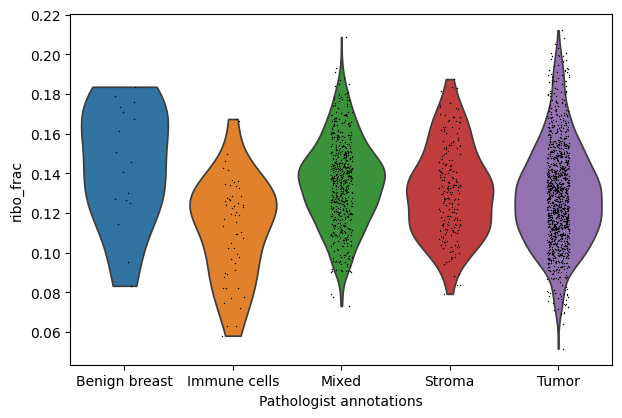

In [25]:
sc.pl.violin(adata_vis, keys='ribo_frac', groupby='Pathologist_annotations')

In [26]:
adata_vis = adata_vis[:, ~adata_vis.var['ribo'].values]
adata_vis

View of AnnData object with n_obs × n_vars = 2061 × 36485
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'

## Determine quality control thresholds

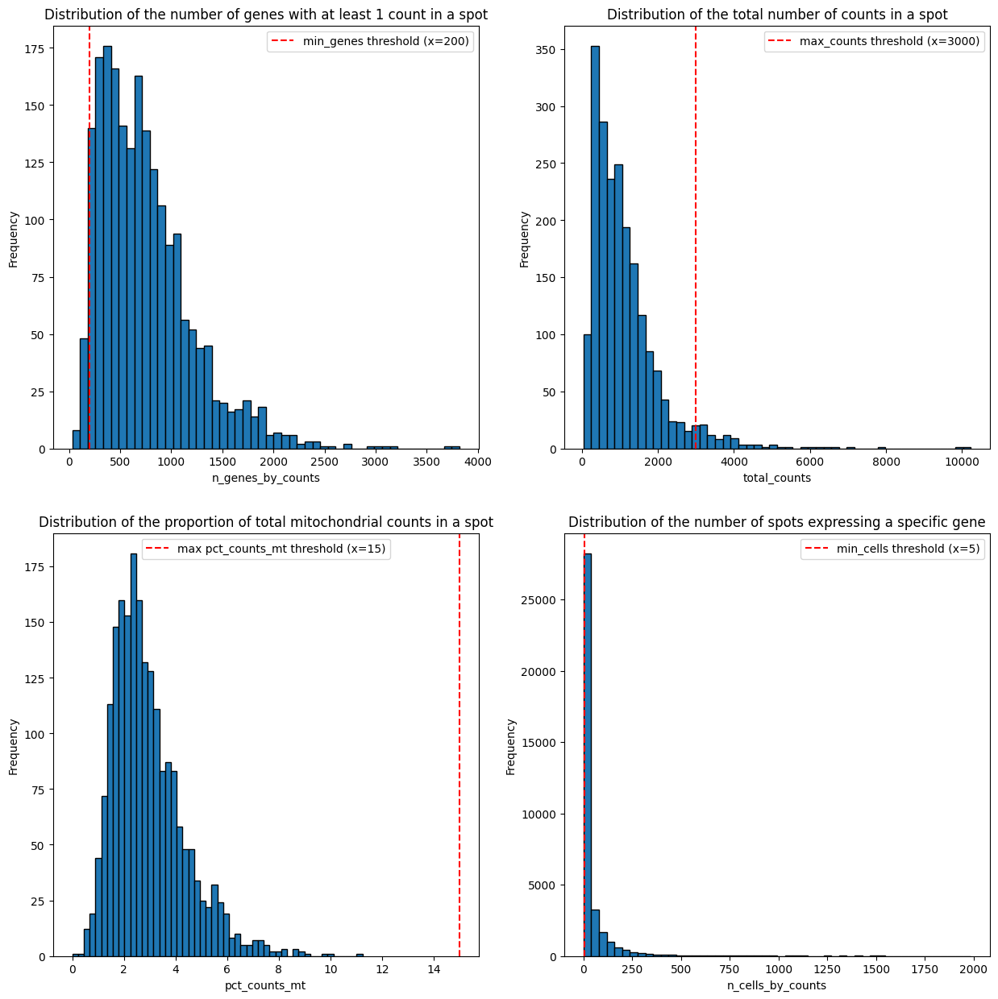

In [27]:
# create 4 subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

# plot n_genes_by_counts for min_genes threshold
axes[0][0].hist(adata_vis.obs['n_genes_by_counts'], bins=50, edgecolor="black")
axes[0][0].set_title('Distribution of the number of genes with at least 1 count in a spot')
axes[0][0].axvline(x=200, color='red', linestyle='--', linewidth=1.5, label='min_genes threshold (x=200)')
axes[0][0].legend()
axes[0][0].set_xlabel('n_genes_by_counts')
axes[0][0].set_ylabel('Frequency')

# plot total_counts for max_counts threshold
axes[0][1].hist(adata_vis.obs['total_counts'], bins=50, edgecolor="black")
axes[0][1].set_title('Distribution of the total number of counts in a spot')
axes[0][1].axvline(x=3000, color='red', linestyle='--', linewidth=1.5, label='max_counts threshold (x=3000)')
axes[0][1].legend()
axes[0][1].set_xlabel('total_counts')
axes[0][1].set_ylabel('Frequency')

# plot pct_counts_mt for pct_counts_mt threshold
axes[1][0].hist(adata_vis.obs['pct_counts_mt'], bins=50, edgecolor="black")
axes[1][0].set_title('Distribution of the proportion of total mitochondrial counts in a spot')
axes[1][0].axvline(x=15, color='red', linestyle='--', linewidth=1.5, label='max pct_counts_mt threshold (x=15)')
axes[1][0].legend()
axes[1][0].set_xlabel('pct_counts_mt')
axes[1][0].set_ylabel('Frequency')

# plot n_cells_by_counts for min_cells threshold
axes[1][1].hist(adata_vis.var['n_cells_by_counts'], bins=50, edgecolor="black")
axes[1][1].set_title('Distribution of the number of spots expressing a specific gene')
axes[1][1].axvline(x=5, color='red', linestyle='--', linewidth=1.5, label='min_cells threshold (x=5)')
axes[1][1].legend()
axes[1][1].set_xlabel('n_cells_by_counts')
axes[1][1].set_ylabel('Frequency')

plt.show()


In [28]:
print(adata_vis)

View of AnnData object with n_obs × n_vars = 2061 × 36485
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'


In [29]:
# choose appropriate thresholds for ST data
sc.pp.filter_cells(adata_vis, min_genes = 200)
sc.pp.filter_cells(adata_vis, max_counts= 3000)
adata_vis = adata_vis[adata_vis.obs["pct_counts_mt"] < 5]

# filter genes that are only present in a few spots
sc.pp.filter_genes(adata_vis, min_cells=5)
adata_vis

/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:283: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number


AnnData object with n_obs × n_vars = 1762 × 14138
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'

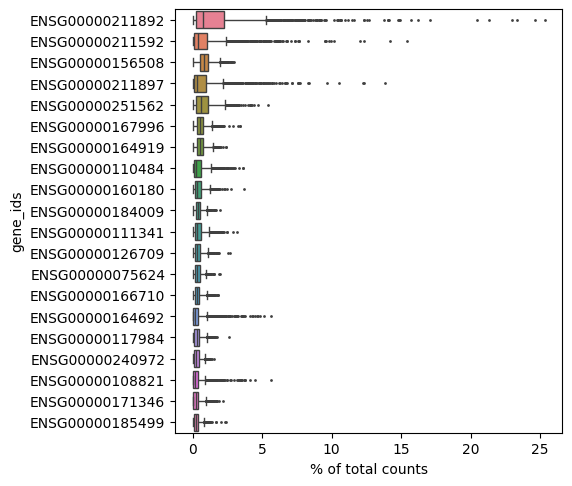

In [30]:
sc.pl.highest_expr_genes(adata_vis, n_top=20, )  # Highest expression genes overall look


## Final structure

In [31]:
adata_vis.var

,feature_types,genome,SYMBOL,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells
gene_ids,,,,,,,,,,
ENSG00000241860,Gene Expression,GRCh38,AL627309.5,False,False,8,0.003882,99.611839,8.0,8
ENSG00000237491,Gene Expression,GRCh38,LINC01409,False,False,25,0.012130,98.786997,25.0,24
ENSG00000228794,Gene Expression,GRCh38,LINC01128,False,False,46,0.022804,97.768074,47.0,40
ENSG00000223764,Gene Expression,GRCh38,LINC02593,False,False,17,0.008248,99.175158,17.0,15
ENSG00000187634,Gene Expression,GRCh38,SAMD11,False,False,21,0.010674,98.981077,22.0,16
...,...,...,...,...,...,...,...,...,...,...
ENSG00000185973,Gene Expression,GRCh38,TMLHE,False,False,20,0.009704,99.029597,20.0,17
ENSG00000124333,Gene Expression,GRCh38,VAMP7,False,False,31,0.015526,98.495876,32.0,29
ENSG00000277400,Gene Expression,GRCh38,AC145212.1,False,False,51,0.024745,97.525473,51.0,44


In [32]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,Pathologist_annotations,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,mt_frac,ribo_frac,n_genes,n_counts
spot_id,,,,,,,,,,,,,,,
V10F03-034_C_AAACACCAATAACTGC-1,1,59,19,V10F03-034_C,Tumor,447,562.0,11.0,1.957295,56.0,9.964413,0.019573,0.099644,411,495.0
V10F03-034_C_AAACAGCTTTCAGAAG-1,1,43,9,V10F03-034_C,Tumor,711,980.0,22.0,2.244898,140.0,14.285715,0.022449,0.142857,644,818.0
V10F03-034_C_AAACAGGGTCTATATT-1,1,47,13,V10F03-034_C,Mixed,754,939.0,18.0,1.916933,92.0,9.797657,0.019169,0.097977,691,829.0
V10F03-034_C_AAACAGTGTTCCTGGG-1,1,73,43,V10F03-034_C,Tumor,306,352.0,17.0,4.829545,34.0,9.659091,0.048295,0.096591,273,301.0
V10F03-034_C_AAACATGGTGAGAGGA-1,1,62,0,V10F03-034_C,Tumor,1229,1770.0,19.0,1.073446,170.0,9.604520,0.010734,0.096045,1157,1581.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V10F03-034_C_TTGTGTTTCCCGAAAG-1,1,51,59,V10F03-034_C,Stroma,721,1269.0,35.0,2.758077,153.0,12.056737,0.027581,0.120567,645,1081.0
V10F03-034_C_TTGTTGTGTGTCAAGA-1,1,31,77,V10F03-034_C,Tumor,338,383.0,12.0,3.133159,31.0,8.093995,0.031332,0.080940,305,340.0
V10F03-034_C_TTGTTTCATTAGTCTA-1,1,60,30,V10F03-034_C,Mixed,1208,2311.0,34.0,1.471225,221.0,9.562960,0.014712,0.095630,1130,2056.0


In [33]:
print(adata_vis)

AnnData object with n_obs × n_vars = 1762 × 14138
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'


# Reading scRNAseq data

In [34]:
adata_ref = ad.read_h5ad('/disk2/user/hilpek/project_root/scRNAseq/input/Wu_all_NT.h5ad')
# Removed HER samples.
adata_ref = adata_ref[(adata_ref.obs['IHC_subtype'] == 'ER+'), :]
# mt and ribo columns have been added to adata.var
adata_ref.var['mt'] = adata_ref.var_names.str.upper().str.startswith('MT-')
adata_ref.var['ribo'] = adata_ref.var_names.str.upper().str.startswith(('RPL', 'RPS'))
adata_ref.var_names_make_unique()
adata_ref

/tmp/ipykernel_308869/834681103.py:5: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata_ref.var['mt'] = adata_ref.var_names.str.upper().str.startswith('MT-')


AnnData object with n_obs × n_vars = 33790 × 29733
    obs: 'Study_id', 'Celltype_subset', 'bc_subtype', 'donor_age', 'treatment_status', 'grade', 'IHC_subtype', 'Dataset'
    var: 'ENSEMBL', 'mt', 'ribo'

In [35]:
adata_ref.obs

,Study_id,Celltype_subset,bc_subtype,donor_age,treatment_status,grade,IHC_subtype,Dataset
CID3941_AAAGTAGTCCTTGCCA,CID3941,Endothelial ACKR1,IDC,50.0,Naive,2.0,ER+,CID3941
CID3941_ACAGCCGAGCTCTCGG,CID3941,Endothelial ACKR1,IDC,50.0,Naive,2.0,ER+,CID3941
CID3941_ACGCAGCAGGACCACA,CID3941,Endothelial ACKR1,IDC,50.0,Naive,2.0,ER+,CID3941
CID3941_ACGCAGCCAGCTGTAT,CID3941,Endothelial ACKR1,IDC,50.0,Naive,2.0,ER+,CID3941
CID3941_ACTTTCACAGCCTGTG,CID3941,Endothelial ACKR1,IDC,50.0,Naive,2.0,ER+,CID3941
...,...,...,...,...,...,...,...,...
CID4535_TAGTGGTCATTGGCGC,CID4535,Mature Luminal,ILC,47.0,Naive,2.0,ER+,CID4535
CID4535_TCTATTGAGCTAGGCA,CID4535,Mature Luminal,ILC,47.0,Naive,2.0,ER+,CID4535
CID4535_TGCTACCAGGTGTGGT,CID4535,Mature Luminal,ILC,47.0,Naive,2.0,ER+,CID4535
CID4535_TGGCCAGAGCCCAACC,CID4535,Mature Luminal,ILC,47.0,Naive,2.0,ER+,CID4535


In [36]:
adata_ref.var

,ENSEMBL,mt,ribo
RP11-34P13.7,ENSGX0000000001,False,False
FO538757.3,ENSGX0000000002,False,False
FO538757.2,ENSGX0000000003,False,False
AP006222.2,ENSGX0000000004,False,False
RP4-669L17.10,ENSGX0000000005,False,False
...,...,...,...
RP11-983C2.3,ENSGX0000010212,False,False
LINC00919,ENSG00000260268,False,False
RP11-589P10.7,ENSGX0000010213,False,False
KRTAP9-2,ENSG00000262573,False,False


/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


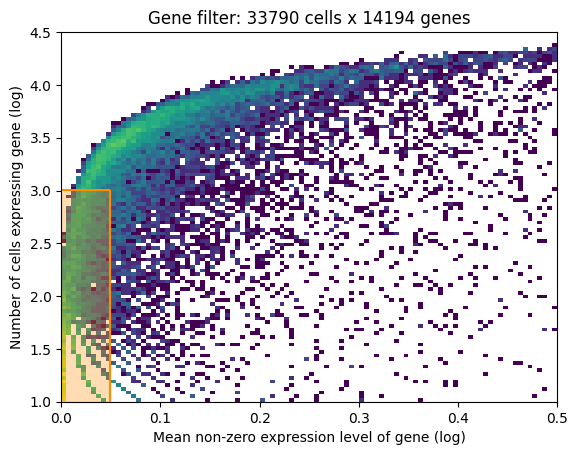

In [37]:
# filter the scRNAseq data 
selected = filter_genes(adata_ref, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
adata_ref = adata_ref[:, selected].copy()

Orange area is the genes excluded based on the combination of number of cells expressing that gene (Y-axis) and average RNA count for cells where the gene was detected (X-axis).

In [38]:
print(adata_vis)

AnnData object with n_obs × n_vars = 1762 × 14138
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'


# Estimation of reference cell type signatures (NB regression)

In [39]:
adata_ref

AnnData object with n_obs × n_vars = 33790 × 14194
    obs: 'Study_id', 'Celltype_subset', 'bc_subtype', 'donor_age', 'treatment_status', 'grade', 'IHC_subtype', 'Dataset'
    var: 'ENSEMBL', 'mt', 'ribo', 'n_cells', 'nonz_mean'

## Train the model

In [40]:
cell2location.models.RegressionModel.setup_anndata(adata=adata_ref,
                        # 10X reaction / sample / batch
                        batch_key='Study_id',
                        # cell type, covariate used for constructing signatures
                        labels_key='Celltype_subset'
                       )

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/scvi/data/fields/_dataframe_field.py:186: UserWarning: Category 41 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(


In [41]:
# create model
mod = RegressionModel(adata_ref)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 1.1.6.post2.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'Study_id',
│   'labels_key': 'Celltype_subset',
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │  10   │
│         n_cells          │ 33790 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │  48   │
│          n_vars          │ 14194 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                    batch State Registry                    
┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃    Source Location    ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Study_id'] │  CID3941   │          0          │
│                       │  CID3948   │          1          │
│                       │  CID4040   │          2          │
│                       │  CID4067   │          3          │
│                       │  CID4290A  │          4          │
│                       │  CID4461   │          5          │
│                       │  CID4463   │          6          │
│                       │  CID4471   │          7          │
│                       │  CID4530N  │          8          │
│                       │  CID4535   │          9          │
└───────────────────────┴────────────┴─────────────────────┘

                                 labels State Registry                                 
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃       Source Location        ┃           Categories           ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Celltype_subset'] │         B cells Memory         │          0          │
│                              │         B cells Naive          │          1          │
│                              │     CAFs MSC iCAF-like s1      │          2          │
│                              │     CAFs MSC iCAF-like s2      │          3          │
│                              │     CAFs Transitioning s3      │          4          │
│                              │       CAFs myCAF like s4       │          5          │
│                              │       CAFs myCAF like s5       │          6          │
│                              │        Cancer Basal SC         │          7          │
│                              │         Cancer Cycling         │          8          │
│                              │         Cancer Her2 SC         │          9          │
│                              │         Cancer LumA SC         │         10          │
│                              │         Cancer LumB SC         │         11          │
│                              │          Cycling PVL           │         12          │
│                              │        Cycling_Myeloid         │         13          │
│                              │       Endothelial ACKR1        │         14          │
│                              │       Endothelial CXCL12       │         15          │
│                              │  Endothelial Lymphatic LYVE1   │         16          │
│                              │        Endothelial RGS5        │         17          │
│                              │      Luminal Progenitors       │         18          │
│                              │         Mature Luminal         │         19          │
│                              │      Myeloid_c0_DC_LAMP3       │         20          │
│                              │     Myeloid_c1_LAM1_FABP5      │         21          │
│                              │      Myeloid_c2_LAM2_APOE      │         22          │
│                              │     Myeloid_c3_cDC1_CLEC9A     │         23          │
│                              │    Myeloid_c4_DCs_pDC_IRF7     │         24          │
│                              │  Myeloid_c7_Monocyte_3_FCGR3A  │         25          │
│                              │  Myeloid_c8_Monocyte_2_S100A9  │         26          │
│                              │ Myeloid_c9_Macrophage_2_CXCL10 │         27          │
│                              │ Myeloid_c10_Macrophage_1_EGR1  │         28          │
│                              │     Myeloid_c11_cDC2_CD1C      │         29          │
│                              │  Myeloid_c12_Monocyte_1_IL1B   │         30          │
│                              │         Myoepithelial          │         31          │
│                              │     PVL Differentiated s3      │         32          │
│                              │        PVL Immature s1         │         33          │
│                              │        PVL_Immature s2         │         34          │
│                              │          Plasmablasts          │         35          │
│                              │      T_cells_c0_CD4+_CCR7      │         36          │
│                              │      T_cells_c1_CD4+_IL7R      │         37          │
│                              │  T_cells_c2_CD4+_T-regs_FOXP3  │         38          │
│                              │   T_cells_c3_CD4+_Tfh_CXCL13   │         39          │
│                              │     T_cells_c4_CD8+_ZFP36      │         40          │
│                              │      T_

In [42]:
# train the model
mod.train(max_epochs=400, accelerator='gpu', device=1)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [20:21<00:00,  3.29s/it, v_num=1, elbo_train=2.12e+8]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [20:21<00:00,  3.05s/it, v_num=1, elbo_train=2.12e+8]


In [43]:
print(adata_vis)

AnnData object with n_obs × n_vars = 1762 × 14138
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'


In [44]:
print(adata_ref)

AnnData object with n_obs × n_vars = 33790 × 14194
    obs: 'Study_id', 'Celltype_subset', 'bc_subtype', 'donor_age', 'treatment_status', 'grade', 'IHC_subtype', 'Dataset', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'ENSEMBL', 'mt', 'ribo', 'n_cells', 'nonz_mean'
    uns: '_scvi_uuid', '_scvi_manager_uuid'


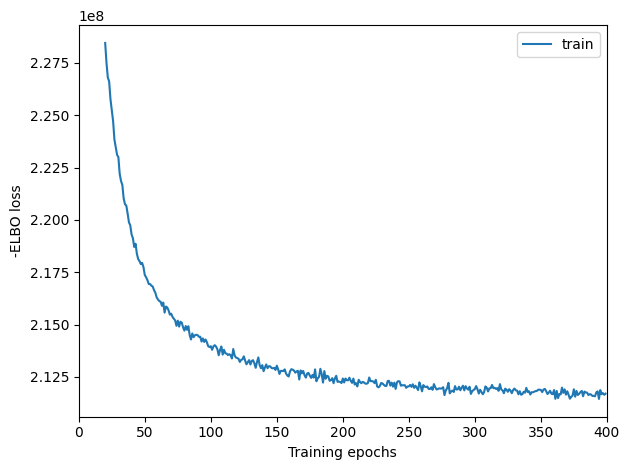

In [45]:
# plot ELBO loss history during training, removing first 20 epochs
mod.plot_history(20)

This plot should have a decreasing trend and level off by the end of training. If it is still decreasing, max_epochs needs to be increased.

## Export results

In [46]:
adata_ref = mod.export_posterior(
    adata_ref, sample_kwargs={'num_samples': 1000, 'batch_size': 2500 }
)
# save model
mod.save(f"{ref_run_name}", overwrite=True)

# save anndata object with results
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref.write(adata_file)
adata_file

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling global variables, sample: 100%|██████████| 999/999 [00:27<00:00, 36.68it/s]


'/disk2/user/hilpek/project_root/cell2location/outputs/cell2loc2_0/reference_signatures/sc.h5ad'

In [47]:
print(adata_vis)

AnnData object with n_obs × n_vars = 1762 × 14138
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'


In [48]:
print(adata_ref)

AnnData object with n_obs × n_vars = 33790 × 14194
    obs: 'Study_id', 'Celltype_subset', 'bc_subtype', 'donor_age', 'treatment_status', 'grade', 'IHC_subtype', 'Dataset', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'ENSEMBL', 'mt', 'ribo', 'n_cells', 'nonz_mean'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    varm: 'means_per_cluster_mu_fg', 'stds_per_cluster_mu_fg', 'q05_per_cluster_mu_fg', 'q95_per_cluster_mu_fg'


### Examine QC

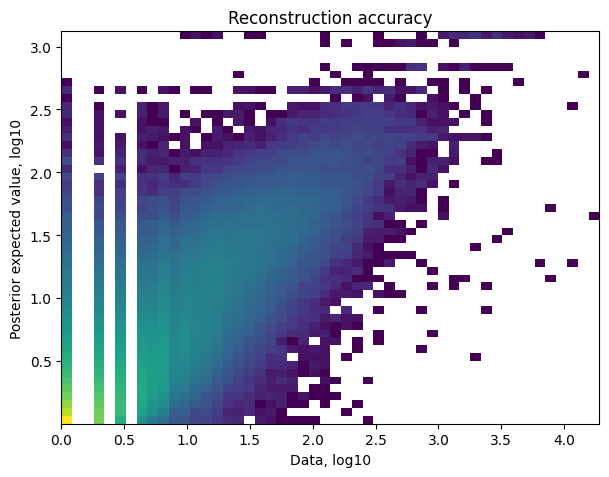

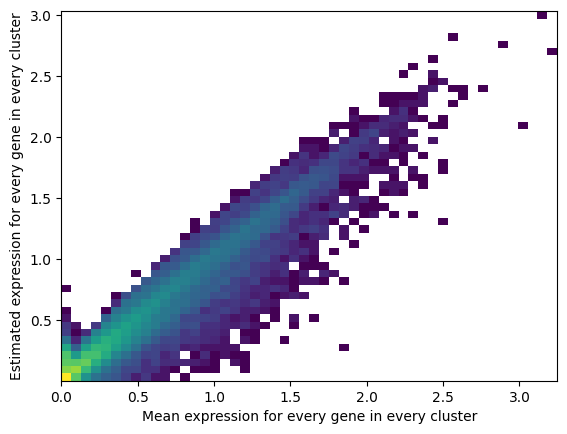

In [49]:
# QC examination
mod.plot_QC()

In [50]:
print(adata_ref)

AnnData object with n_obs × n_vars = 33790 × 14194
    obs: 'Study_id', 'Celltype_subset', 'bc_subtype', 'donor_age', 'treatment_status', 'grade', 'IHC_subtype', 'Dataset', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'ENSEMBL', 'mt', 'ribo', 'n_cells', 'nonz_mean'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    varm: 'means_per_cluster_mu_fg', 'stds_per_cluster_mu_fg', 'q05_per_cluster_mu_fg', 'q95_per_cluster_mu_fg'


In [51]:
print(adata_vis)

AnnData object with n_obs × n_vars = 1762 × 14138
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'


1. Reconstruction accuracy to assess if there are any issues with inference. This 2D histogram plot should have most observations along a noisy diagonal.

2. The estimated expression signatures are distinct from mean expression in each cluster because of batch effects. For scRNA-seq datasets which do not suffer from batch effect, cluster average expression can be used instead of estimating signatures with a model. When this plot is very different from a diagonal plot (e.g. very low values on Y-axis, density everywhere) it indicates problems with signature estimation.

### Extract reference cell type signatures to Pandas

Note: All parameters of the a Negative Binomial regression model are exported into reference anndata object, however for spatial mapping we just need the estimated expression of every gene in every cell type. Here we extract that from standard output:

In [52]:
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.head()


,B cells Memory,B cells Naive,CAFs MSC iCAF-like s1,CAFs MSC iCAF-like s2,CAFs Transitioning s3,CAFs myCAF like s4,CAFs myCAF like s5,Cancer Basal SC,Cancer Cycling,Cancer Her2 SC,...,T_cells_c2_CD4+_T-regs_FOXP3,T_cells_c3_CD4+_Tfh_CXCL13,T_cells_c4_CD8+_ZFP36,T_cells_c5_CD8+_GZMK,T_cells_c6_IFIT1,T_cells_c7_CD8+_IFNG,T_cells_c8_CD8+_LAG3,T_cells_c9_NK_cells_AREG,T_cells_c10_NKT_cells_FCGR3A,T_cells_c11_MKI67
FO538757.2,0.022958,0.141767,0.084321,0.086611,0.096681,0.096441,0.133353,0.168806,0.347691,0.211279,...,0.031393,0.028691,0.009701,0.362487,0.046445,0.014148,0.010414,0.035278,0.010243,0.108284
AP006222.2,0.004770,0.199060,0.036922,0.050389,0.112101,0.172771,0.124334,0.047693,0.176451,0.041937,...,0.002146,0.002425,0.009329,0.344011,0.014386,0.003756,0.020719,0.009687,0.007207,0.020167
RP11-206L10.9,0.010167,0.168630,0.019860,0.016591,0.028392,0.022918,0.027442,0.025475,0.112685,0.071875,...,0.011574,0.003947,0.015343,0.349382,0.008367,0.003674,0.020171,0.007623,0.007685,0.048787
SAMD11,0.003819,0.405236,0.127662,0.044265,0.200892,0.077802,0.259912,0.036212,0.015450,0.025615,...,0.003209,0.002863,0.001468,0.642533,0.009238,0.002276,0.004968,0.002564,0.004802,0.011404
NOC2L,0.052691,0.138924,0.082498,0.118569,0.122474,0.128609,0.253684,0.366626,1.017163,0.456979,...,0.046580,0.037510,0.034806,0.268818,0.026989,0.037738,0.214286,0.034227,0.055122,0.153428


In [53]:
print(adata_ref)

AnnData object with n_obs × n_vars = 33790 × 14194
    obs: 'Study_id', 'Celltype_subset', 'bc_subtype', 'donor_age', 'treatment_status', 'grade', 'IHC_subtype', 'Dataset', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'ENSEMBL', 'mt', 'ribo', 'n_cells', 'nonz_mean'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    varm: 'means_per_cluster_mu_fg', 'stds_per_cluster_mu_fg', 'q05_per_cluster_mu_fg', 'q95_per_cluster_mu_fg'


In [54]:
print(adata_vis)

AnnData object with n_obs × n_vars = 1762 × 14138
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors'
    obsm: 'spatial', 'MT', 'RB'


In [55]:
print(inf_aver.index)


Index(['FO538757.2', 'AP006222.2', 'RP11-206L10.9', 'SAMD11', 'NOC2L',
       'RP11-54O7.17', 'HES4', 'ISG15', 'AGRN', 'RNF223',
       ...
       'GAGE12E', 'GAGE12F', 'GAGE1', 'ADAM18', 'APOC3', 'CST9L',
       'RP11-503D12.1', 'GPR139', 'C15orf43', 'RP11-543N12.1'],
      dtype='object', length=14194)


In [56]:
print(adata_vis.var_names)

Index(['ENSG00000241860', 'ENSG00000237491', 'ENSG00000228794',
       'ENSG00000223764', 'ENSG00000187634', 'ENSG00000188976',
       'ENSG00000187961', 'ENSG00000187583', 'ENSG00000187642',
       'ENSG00000272512',
       ...
       'ENSG00000165775', 'ENSG00000182712', 'ENSG00000185515',
       'ENSG00000155959', 'ENSG00000155962', 'ENSG00000185973',
       'ENSG00000124333', 'ENSG00000277400', 'ENSG00000278817',
       'ENSG00000277196'],
      dtype='object', name='gene_ids', length=14138)


In [57]:
import mygene
mg = mygene.MyGeneInfo()

# Get Ensembl IDs
ensembl_ids = adata_vis.var_names.tolist()

# Query gene symbols using mygene
query = mg.querymany(ensembl_ids, scopes='ensembl.gene', fields='symbol', species='human')

# Create a mapping from Ensembl ID to gene symbol (filter out entries with no symbol)
ens_to_symbol = {q['query']: q['symbol'] for q in query if 'symbol' in q and q['symbol'] is not None}


Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed


90 input query terms found no hit:	['ENSG00000271895', 'ENSG00000261135', 'ENSG00000225986', 'ENSG00000273373', 'ENSG00000259834', 'ENS


In [58]:
# Keep only genes that have a matching symbol
valid_genes = [g for g in adata_vis.var_names if g in ens_to_symbol]

# Filter and rename the gene names in the object
adata_vis = adata_vis[:, valid_genes].copy()
adata_vis.var_names = [ens_to_symbol[g] for g in valid_genes]


In [59]:
print("adata_vis.shape (final):", adata_vis.shape)
print("inf_aver.shape (final):", inf_aver.shape)
print("Example gene names:", adata_vis.var_names[:5])


adata_vis.shape (final): (1762, 13722)
inf_aver.shape (final): (14194, 48)
Example gene names: Index(['LINC01409', 'LINC01128', 'LINC02593', 'SAMD11', 'NOC2L'], dtype='object')


# Cell2location: spatial mapping

In [60]:
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
adata_vis.var_names_make_unique()


In [61]:
print(f"Common gene count: {len(intersect)}")


Common gene count: 11067


In [62]:
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_vis, batch_key="sample")

In [63]:
print(adata_vis)

AnnData object with n_obs × n_vars = 1762 × 11067
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'spatial', 'MT', 'RB'


In [64]:
print(adata_ref)

AnnData object with n_obs × n_vars = 33790 × 14194
    obs: 'Study_id', 'Celltype_subset', 'bc_subtype', 'donor_age', 'treatment_status', 'grade', 'IHC_subtype', 'Dataset', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'ENSEMBL', 'mt', 'ribo', 'n_cells', 'nonz_mean'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    varm: 'means_per_cluster_mu_fg', 'stds_per_cluster_mu_fg', 'q05_per_cluster_mu_fg', 'q95_per_cluster_mu_fg'


### Train the model

**Important:** To use cell2location spatial mapping model, you need to specify 2 user-provided hyperparameters (N_cells_per_location and detection_alpha).

_a) Choosing hyperparameter ``N_cells_per_location``_

It is useful to adapt the expected cell abundance N_cells_per_location to every tissue. This value can be estimated from paired histology images as explained [here](https://github.com/BayraktarLab/cell2location/blob/master/docs/images/Note_on_selecting_hyperparameters.pdf). This parameter can be estimated by manually counting nuclei in a 10-20 locations in the histology image (e.g. using 10X Loupe browser), and computing the average cell abundance.

_b) Choosing hyperparameter ``detection_alpha``_

To improve accuracy & sensitivity on datasets with large technical variability in RNA detection sensitivity within the slide/batch - you need to relax regularisation of per-location normalisation (use detection_alpha=20). High technical variability in RNA detection sensitivity is present in your sample when you observe the spatial distribution of total RNA count per location that doesn’t match expected cell numbers based on histological examination.

In [65]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_vis, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=40,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=5
)
mod.view_anndata_setup()


Anndata setup with scvi-tools version 1.1.6.post2.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 1762  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 11067 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                    batch State Registry                    
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃  Categories  ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │ V10F03-034_C │          0          │
└─────────────────────┴──────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [66]:
print(inf_aver.index[:10])         # Top 10 gene names (reference)
print(adata_vis.var_names[:10])    # Top 10 gene names (spatial data)


Index(['A1BG', 'A1BG-AS1', 'A2M', 'A4GALT', 'AAAS', 'AACS', 'AAGAB', 'AAK1',
       'AAMDC', 'AAMP'],
      dtype='object')
Index(['A1BG', 'A1BG-AS1', 'A2M', 'A4GALT', 'AAAS', 'AACS', 'AAGAB', 'AAK1',
       'AAMDC', 'AAMP'],
      dtype='object')


In [67]:
print(adata_vis)

AnnData object with n_obs × n_vars = 1762 × 11067
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'spatial', 'MT', 'RB'


In [68]:
mod.train(max_epochs=40000,
          # train using full data (batch_size=None)
          batch_size=None,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          train_size=1,
          log_every_n_steps=1,
         )


Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/lightning/pytorch/trainer/configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-pac

Epoch 40000/40000: 100%|██████████| 40000/40000 [2:17:55<00:00, 11.44it/s, v_num=1, elbo_train=3.87e+6]  

`Trainer.fit` stopped: `max_epochs=40000` reached.


Epoch 40000/40000: 100%|██████████| 40000/40000 [2:17:55<00:00,  4.83it/s, v_num=1, elbo_train=3.87e+6]


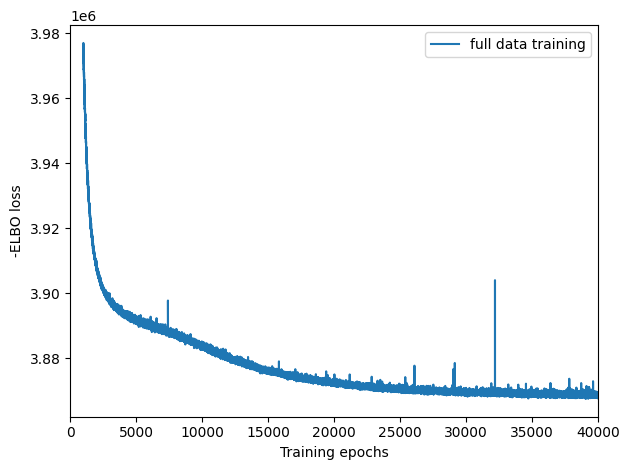

In [69]:
# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);


### Export results

In [70]:
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_vis.write(adata_file)

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


Sampling global variables, sample: 100%|██████████| 999/999 [00:16<00:00, 61.93it/s]


### Examine QC

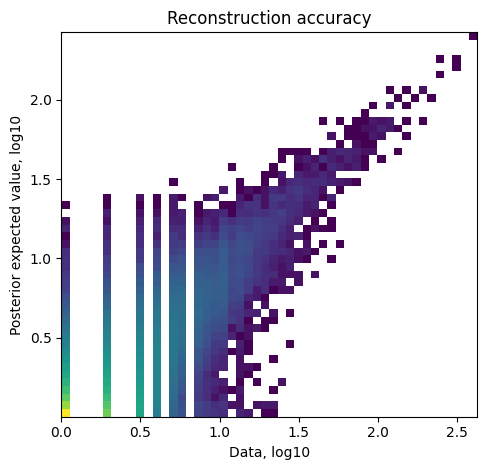

In [71]:
mod.plot_QC()

The plot should be roughly diagonal, strong deviations will signal problems that need to be investigated.

In [72]:
adata_vis

AnnData object with n_obs × n_vars = 1762 × 11067
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'feature_types', 'genome', 'SYMBOL', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'spatial', 'Pathologist_annotations_colors', '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'spatial', 'MT', 'RB', 'means_cell_abundance_w_sf', 'stds_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf'

# Visualising cell abundance in spatial coordinates

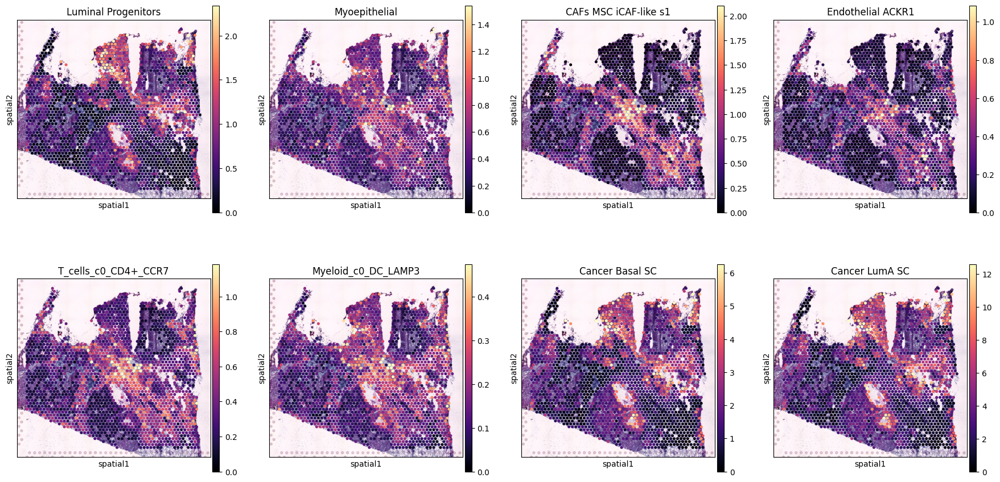

In [73]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

# select one slide
slide = select_slide(adata_vis, 'V10F03-034_C')

# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(slide, cmap='magma',
                  # show first 8 cell types
                  color=['Luminal Progenitors', 'Myoepithelial', 'CAFs MSC iCAF-like s1', 'Endothelial ACKR1',
                         'T_cells_c0_CD4+_CCR7', 'Myeloid_c0_DC_LAMP3', 'Cancer Basal SC', 'Cancer LumA SC'],
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2'
                 )

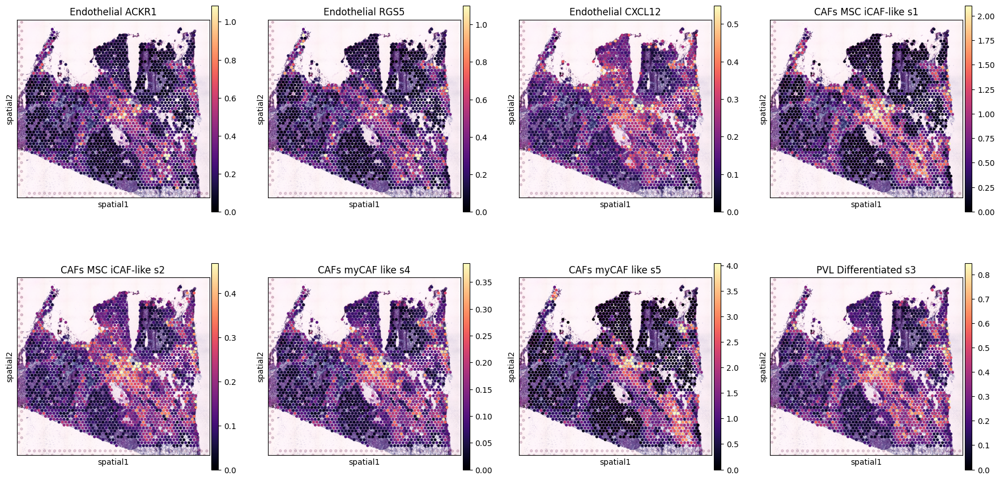

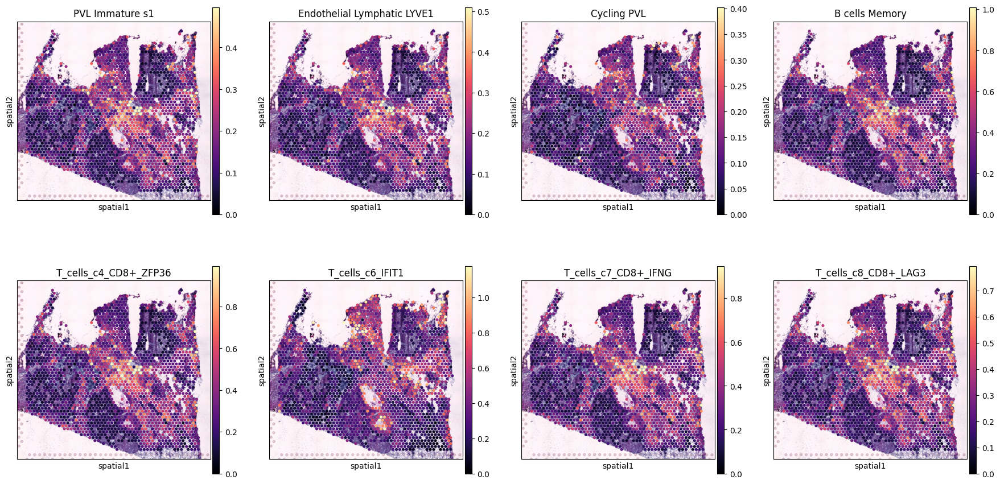

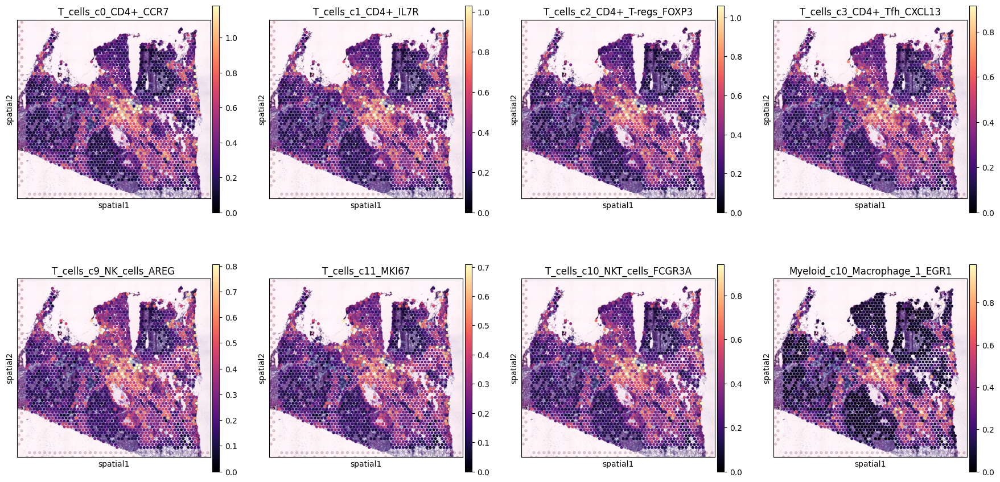

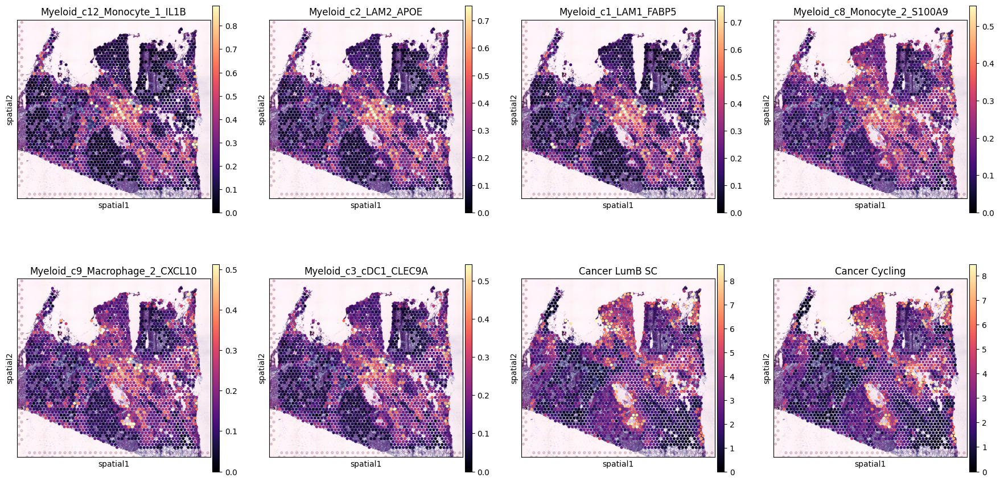

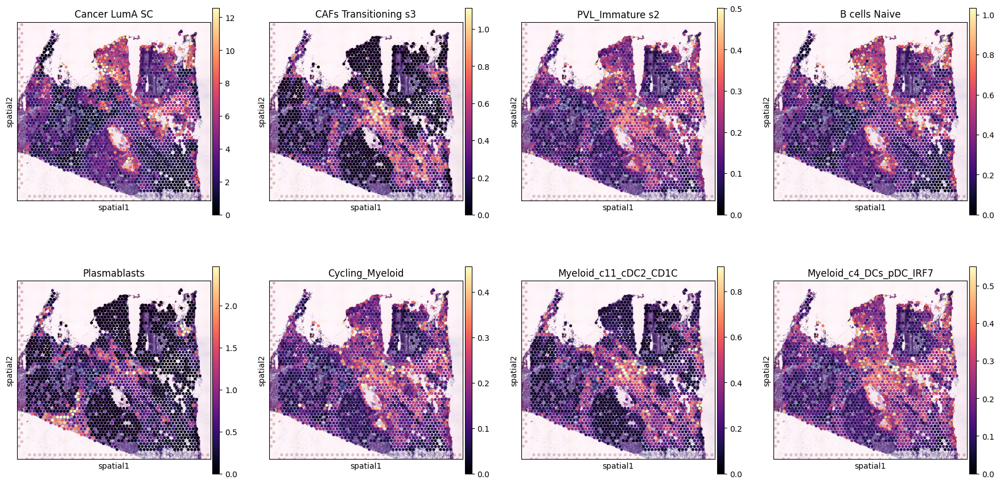

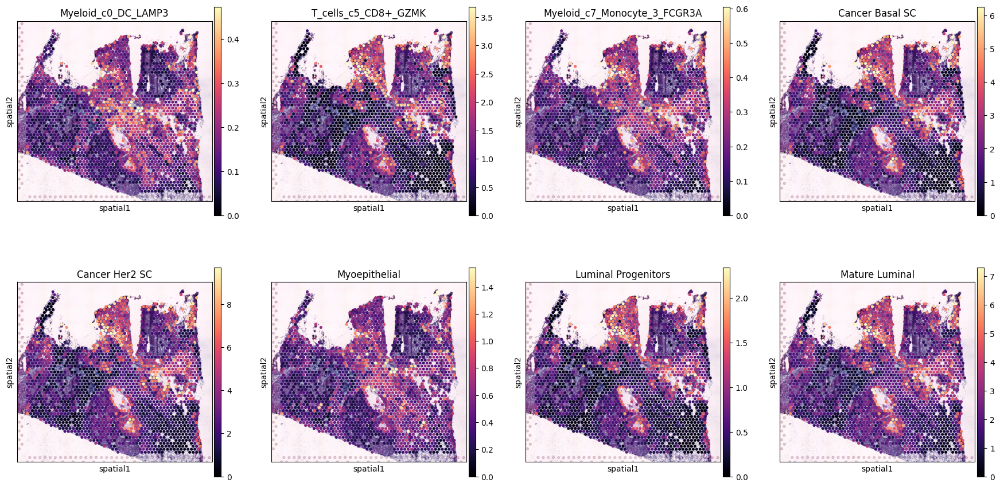

In [74]:
# same as above, but to visualise all cell types
slide = select_slide(adata_vis, 'V10F03-034_C')
cell_types = list(adata_ref.obs["Celltype_subset"].unique())

for i in range(0, len(cell_types), 8):
    with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
        sc.pl.spatial(slide, cmap='magma',
                      # show first 8 cell types
                      color=cell_types[i:i+8],
                      ncols=4, size=1.3,
                      img_key='hires',
                      # limit color scale at 99.2% quantile of cell abundance
                      vmin=0, vmax='p99.2'
                     )

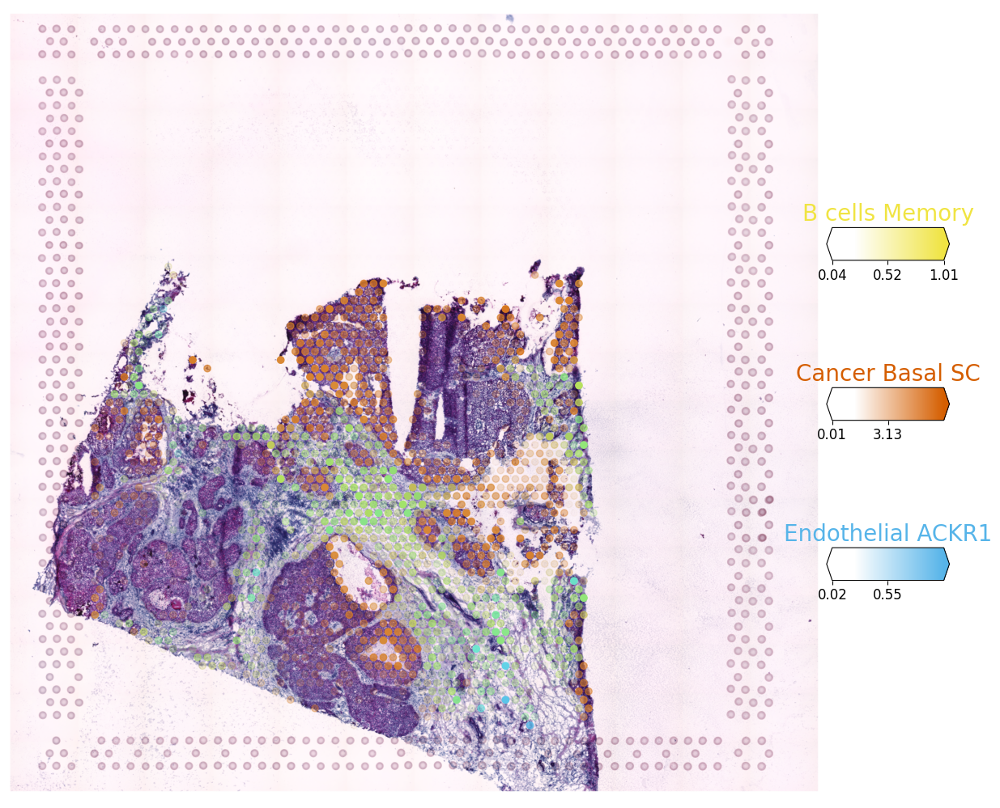

In [75]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
clust_labels = ['B cells Memory', 'Cancer Basal SC', 'Endothelial ACKR1']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

slide = select_slide(adata_vis, 'V10F03-034_C')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        colorbar_position='right'
    )

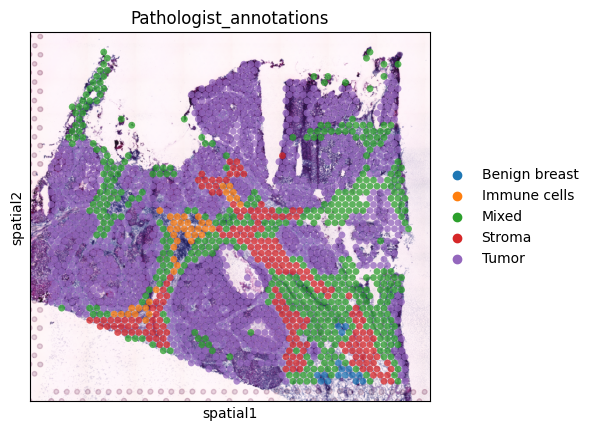

In [76]:
# pathologist annotation of the used sample
sc.pl.spatial(adata_vis, img_key="hires", color="Pathologist_annotations", size=1.5, alpha=0.75)

### Save the results of the estimation for each slide separately

In [77]:
slides = ["V10F03-034_C"]
for slide_name in slides:
    adata_slide = select_slide(adata_vis, 'V10F03-034_C')
    adata_slide.write(os.path.join(results_folder +"/estimations", slide_name + ".h5ad"))

# Re-annotation based on the cell2location mappings

In [78]:
# run this cell to load a slide without running the above analysis
slide_name = "V10F03-034_C"
slide = sc.read(os.path.join(results_folder +"/estimations", slide_name))
slide

AnnData object with n_obs × n_vars = 1762 × 11067
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts', '_indices', '_scvi_batch', '_scvi_labels', 'B cells Memory', 'B cells Naive', 'CAFs MSC iCAF-like s1', 'CAFs MSC iCAF-like s2', 'CAFs Transitioning s3', 'CAFs myCAF like s4', 'CAFs myCAF like s5', 'Cancer Basal SC', 'Cancer Cycling', 'Cancer Her2 SC', 'Cancer LumA SC', 'Cancer LumB SC', 'Cycling PVL', 'Cycling_Myeloid', 'Endothelial ACKR1', 'Endothelial CXCL12', 'Endothelial Lymphatic LYVE1', 'Endothelial RGS5', 'Luminal Progenitors', 'Mature Luminal', 'Myeloid_c0_DC_LAMP3', 'Myeloid_c1_LAM1_FABP5', 'Myeloid_c2_LAM2_APOE', 'Myeloid_c3_cDC1_CLEC9A', 'Myeloid_c4_DCs_pDC_IRF7', 'Myeloid_c7_Monocyte_3_FCGR3A', 'Myeloid_c8_Monocyte_2_S100A9', 'Myeloid_c9_Macrophage_2_CXCL10', 'Myeloid_c10_Macrophage_1

In [79]:
slide = select_slide(adata_vis, 'V10F03-034_C')
slide

AnnData object with n_obs × n_vars = 1762 × 11067
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'Pathologist_annotations', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'mt_frac', 'ribo_frac', 'n_genes', 'n_counts', '_indices', '_scvi_batch', '_scvi_labels', 'B cells Memory', 'B cells Naive', 'CAFs MSC iCAF-like s1', 'CAFs MSC iCAF-like s2', 'CAFs Transitioning s3', 'CAFs myCAF like s4', 'CAFs myCAF like s5', 'Cancer Basal SC', 'Cancer Cycling', 'Cancer Her2 SC', 'Cancer LumA SC', 'Cancer LumB SC', 'Cycling PVL', 'Cycling_Myeloid', 'Endothelial ACKR1', 'Endothelial CXCL12', 'Endothelial Lymphatic LYVE1', 'Endothelial RGS5', 'Luminal Progenitors', 'Mature Luminal', 'Myeloid_c0_DC_LAMP3', 'Myeloid_c1_LAM1_FABP5', 'Myeloid_c2_LAM2_APOE', 'Myeloid_c3_cDC1_CLEC9A', 'Myeloid_c4_DCs_pDC_IRF7', 'Myeloid_c7_Monocyte_3_FCGR3A', 'Myeloid_c8_Monocyte_2_S100A9', 'Myeloid_c9_Macrophage_2_CXCL10', 'Myeloid_c10_Macrophage_1

The idea behind this re-assignment approach is that for each cell type, the spots with estimated cell abundance values above the range of the threshold are assigned as that cell type. 

For example, if minimum estimation for Plasmablasts is 0 and maximum estimation is 10 with a 0.7 (== 70%) threshold, then the spots which have an estimation above 7 will be re-assigned as Plasmablasts.

In [80]:
for cell_type in adata_ref.obs["Celltype_subset"].unique():
    # get the mapping results for the cell_type
    mapping = slide.obs[cell_type]

    # get the range of the cell abundance estimations
    est_min = min(mapping)
    est_max = max(mapping)
    est_range = est_max - est_min

    # determine the threshold for cell type assignment to spots (between 0 and 1)
    threshold = 0.7

    # create a column for cell_type assignment
    slide.obs["Assign " + cell_type + "?"] = mapping >= (est_min + est_range * threshold)

## Determine the number of assignments for each spot

In [81]:
assign_columns = [col for col in slide.obs.columns if col.startswith("Assign ")]

# count the number of True values in assignments
slide.obs["Assignment Count"] = slide.obs[assign_columns].sum(axis=1)
slide.obs

,in_tissue,array_row,array_col,sample,Pathologist_annotations,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,...,Assign Myeloid_c4_DCs_pDC_IRF7?,Assign Myeloid_c0_DC_LAMP3?,Assign T_cells_c5_CD8+_GZMK?,Assign Myeloid_c7_Monocyte_3_FCGR3A?,Assign Cancer Basal SC?,Assign Cancer Her2 SC?,Assign Myoepithelial?,Assign Luminal Progenitors?,Assign Mature Luminal?,Assignment Count
spot_id,,,,,,,,,,,,,,,,,,,,,
V10F03-034_C_AAACACCAATAACTGC-1,1,59,19,V10F03-034_C,Tumor,447,562.0,11.0,1.957295,56.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAACAGCTTTCAGAAG-1,1,43,9,V10F03-034_C,Tumor,711,980.0,22.0,2.244898,140.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAACAGGGTCTATATT-1,1,47,13,V10F03-034_C,Mixed,754,939.0,18.0,1.916933,92.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAACAGTGTTCCTGGG-1,1,73,43,V10F03-034_C,Tumor,306,352.0,17.0,4.829545,34.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAACATGGTGAGAGGA-1,1,62,0,V10F03-034_C,Tumor,1229,1770.0,19.0,1.073446,170.0,...,False,False,False,False,False,False,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V10F03-034_C_TTGTGTTTCCCGAAAG-1,1,51,59,V10F03-034_C,Stroma,721,1269.0,35.0,2.758077,153.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_TTGTTGTGTGTCAAGA-1,1,31,77,V10F03-034_C,Tumor,338,383.0,12.0,3.133159,31.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_TTGTTTCATTAGTCTA-1,1,60,30,V10F03-034_C,Mixed,1208,2311.0,34.0,1.471225,221.0,...,False,False,False,False,False,False,False,False,False,0


In [82]:
slide.obs[slide.obs["Assignment Count"]==0]

,in_tissue,array_row,array_col,sample,Pathologist_annotations,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,...,Assign Myeloid_c4_DCs_pDC_IRF7?,Assign Myeloid_c0_DC_LAMP3?,Assign T_cells_c5_CD8+_GZMK?,Assign Myeloid_c7_Monocyte_3_FCGR3A?,Assign Cancer Basal SC?,Assign Cancer Her2 SC?,Assign Myoepithelial?,Assign Luminal Progenitors?,Assign Mature Luminal?,Assignment Count
spot_id,,,,,,,,,,,,,,,,,,,,,
V10F03-034_C_AAACACCAATAACTGC-1,1,59,19,V10F03-034_C,Tumor,447,562.0,11.0,1.957295,56.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAACAGCTTTCAGAAG-1,1,43,9,V10F03-034_C,Tumor,711,980.0,22.0,2.244898,140.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAACAGGGTCTATATT-1,1,47,13,V10F03-034_C,Mixed,754,939.0,18.0,1.916933,92.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAACAGTGTTCCTGGG-1,1,73,43,V10F03-034_C,Tumor,306,352.0,17.0,4.829545,34.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_AAACATGGTGAGAGGA-1,1,62,0,V10F03-034_C,Tumor,1229,1770.0,19.0,1.073446,170.0,...,False,False,False,False,False,False,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V10F03-034_C_TTGTGTTTCCCGAAAG-1,1,51,59,V10F03-034_C,Stroma,721,1269.0,35.0,2.758077,153.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_TTGTTGTGTGTCAAGA-1,1,31,77,V10F03-034_C,Tumor,338,383.0,12.0,3.133159,31.0,...,False,False,False,False,False,False,False,False,False,0
V10F03-034_C_TTGTTTCATTAGTCTA-1,1,60,30,V10F03-034_C,Mixed,1208,2311.0,34.0,1.471225,221.0,...,False,False,False,False,False,False,False,False,False,0


In [83]:
countlist = list(slide.obs["Assignment Count"].unique())
countlist.sort()
for num in countlist:
    print("num of cell types assigned:", num, "num of spots assigned:", slide.obs[slide.obs["Assignment Count"]==num].shape[0])

num of cell types assigned: 0 num of spots assigned: 1588
num of cell types assigned: 1 num of spots assigned: 65
num of cell types assigned: 2 num of spots assigned: 28
num of cell types assigned: 3 num of spots assigned: 10
num of cell types assigned: 4 num of spots assigned: 11
num of cell types assigned: 5 num of spots assigned: 6
num of cell types assigned: 6 num of spots assigned: 9
num of cell types assigned: 7 num of spots assigned: 8
num of cell types assigned: 8 num of spots assigned: 9
num of cell types assigned: 9 num of spots assigned: 7
num of cell types assigned: 10 num of spots assigned: 2
num of cell types assigned: 11 num of spots assigned: 2
num of cell types assigned: 12 num of spots assigned: 5
num of cell types assigned: 16 num of spots assigned: 1
num of cell types assigned: 17 num of spots assigned: 1
num of cell types assigned: 19 num of spots assigned: 3
num of cell types assigned: 20 num of spots assigned: 1
num of cell types assigned: 21 num of spots assigne

## Identifying discrete tissue regions by Leiden clustering

In [84]:
# compute KNN using the cell2location output stored in adata.obsm
sc.pp.neighbors(adata_vis, use_rep='q05_cell_abundance_w_sf',
                n_neighbors = 15)

# Cluster spots into regions using scanpy
sc.tl.leiden(adata_vis, resolution=1.1)

# add region as categorical variable
adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"].astype("category")

/tmp/ipykernel_308869/23575634.py:6: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_vis, resolution=1.1)


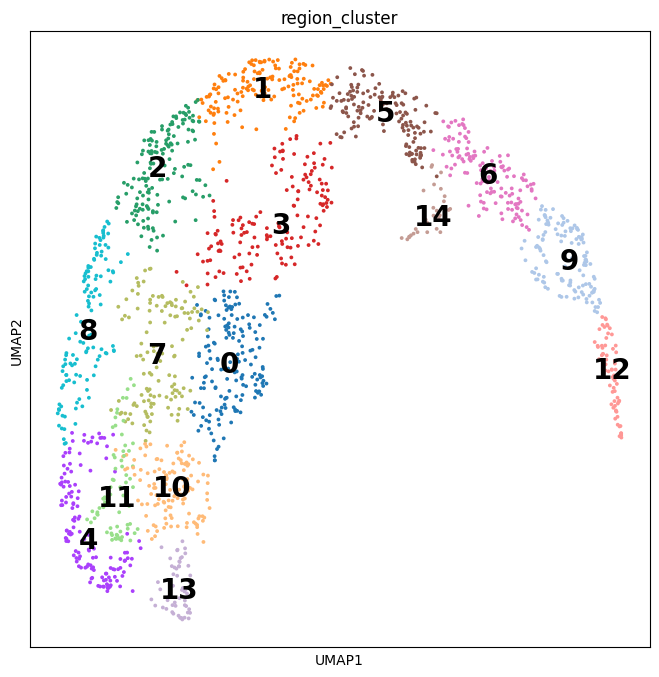

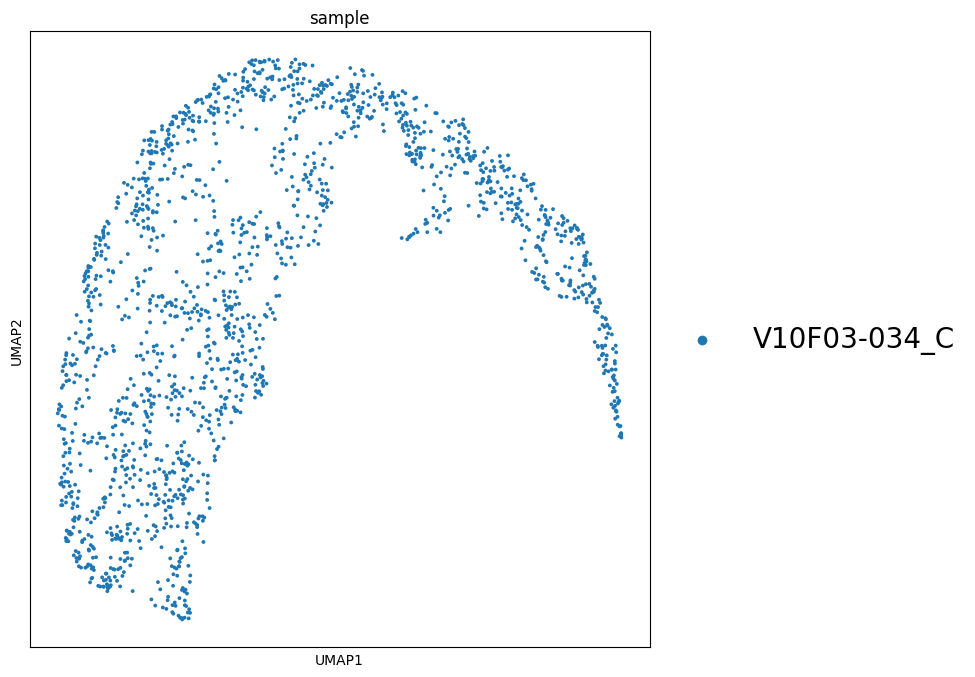

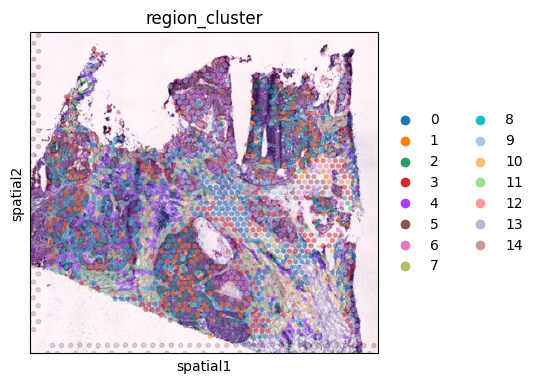

In [85]:
# compute UMAP using KNN graph based on the cell2location output
sc.tl.umap(adata_vis, min_dist = 0.3, spread = 1)

# show regions in UMAP coordinates
with mpl.rc_context({'axes.facecolor':  'white',
                     'figure.figsize': [8, 8]}):
    sc.pl.umap(adata_vis, color=['region_cluster'], size=30,
               color_map = 'RdPu', ncols = 2, legend_loc='on data',
               legend_fontsize=20)
    sc.pl.umap(adata_vis, color=['sample'], size=30,
               color_map = 'RdPu', ncols = 2,
               legend_fontsize=20)

# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
    sc.pl.spatial(adata_vis, color=['region_cluster'],
                  size=1.3, img_key='hires', alpha=0.5)

### Identifying cellular compartments / tissue zones using matrix factorisation (NMF)

In [86]:
from cell2location import run_colocation
res_dict, adata_vis = run_colocation(
    adata_vis,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(11, 13), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': f'{run_name}/CoLocatedComb/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_11combinations_1762locations_48factors


/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_1762locations_48factors


/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/disk2/user/hilpek/miniconda3/envs/cell2_env/lib/python3.9/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


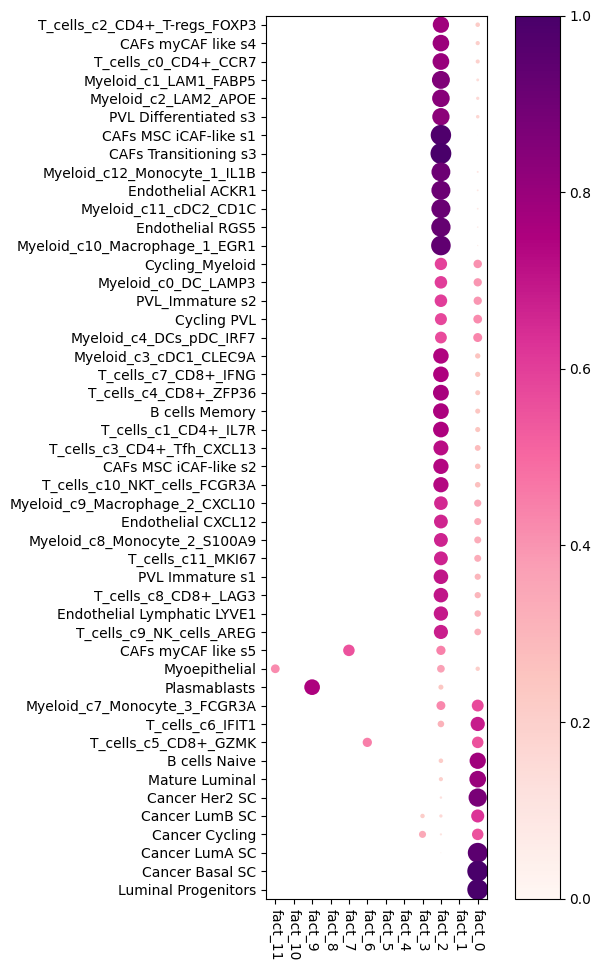

In [87]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact12']['mod'].plot_cell_type_loadings()

## Save the assignment results

In [88]:
slide_name = "V10F03-034_C"
slide.write(os.path.join(results_folder+"/estimations", slide_name + ".h5ad"))